<a href="https://colab.research.google.com/github/sayakpaul/E2E-Object-Detection-in-TFLite/blob/master/colab_training/Training_MobileDet_Custom_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this notebook we will be fine-tuning a **MobileDet** model on the [**fruits dataset**](https://www.kaggle.com/mbkinaci/fruit-images-for-object-detection). The original model checkpoints were generated in TensorFlow 1, so we need to stick to a TF 1 runtime. The purpose is to demonstrate the workflow here and not achieve state-of-the-art results. So, please expect unexpected performance for a shorter training schedule. Toward the very end, we will also see how to optimize our fine-tuned model using TensorFlow Lite APIs and run inference with it. This part will be executed on a TF 2 runtime. 

As a prerequisite, you should be familiar with the contents of this notebook (TODO: add link). It deals with the dataset contstruction part. 

# Setup

In [ ]:
#@title Install TFOD API (TF 1)
%tensorflow_version 1.x
import tensorflow as tf 
print(tf.__version__)

!git clone https://github.com/tensorflow/models.git

% cd models/research
!pip install --upgrade pip
# Compile protos.
!protoc object_detection/protos/*.proto --python_out=.
# Install TensorFlow Object Detection API.
!cp object_detection/packages/tf1/setup.py .
!python -m pip install --use-feature=2020-resolver .

# Fetch the TFRecords and `.pbtxt` of the fruits dataset

TFOD API operates on TensorFlow Records (TFRecords) at least if you are training in a non-eager mode. You can refer to this notebook (TODO: add link) in case you are interested to know how I generated these files. 

In [ ]:
#@title Fetch
%%bash
wget -q https://github.com/sayakpaul/E2E-Object-Detection-in-TFLite/releases/download/v0.2.0/Fruits_Detection_Data.zip
unzip -qq Fruits_Detection_Data.zip

In [ ]:
#@title Optionally verify the TFRecords
!ls -lh *.record* 

-rw-r--r-- 1 root root 6.8M Sep 15  2020 test.record
-rw-r--r-- 1 root root  23M Sep 15  2020 train.record


# Fetch pre-trained MobileDet model checkpoints and configuration

MobileDet comes in different variants (refer [here](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf1_detection_zoo.md)). We will be using the `ssdlite_mobiledet_cpu` variant. 

TFOD API operates with configuration files to train and evaluate models (the TF 2 release supports eager model execution too). For the purpose of this notebook, I created a configuration file following instructions from [here](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/configuring_jobs.md). Note that I purposefully kept the `num_steps` argument to 2000. Here's a *non-exhaustive* list of the arguments I changed - 

-  `batch_size: 32`
- `label_map_path` and `input_path` inside `train_input_reader` and `tf_record_input_reader` respectively. The `num_examples` argument inside `eval_config` is set to 117.

In [ ]:
#@title Download model checkpoint and config
!wget -q http://download.tensorflow.org/models/object_detection/ssdlite_mobiledet_cpu_320x320_coco_2020_05_19.tar.gz
!wget -q https://gist.githubusercontent.com/sayakpaul/9efad54dee957cc55b3adacf992a7a47/raw/7ab5cf7db9e7f7d797d06d15c8b50ace93413643/ssdlite_mobiledet_cpu_320x320_fruits_sync_4x4.config

In [ ]:
#@title Untar and verify the file structure of the model checkpoints
!tar -xvf ssdlite_mobiledet_cpu_320x320_coco_2020_05_19.tar.gz

ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/model.ckpt-400000.data-00000-of-00001
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/model.ckpt-400000.index
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/model.ckpt-400000.meta
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/tflite_graph.pbtxt
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/tflite_graph.pb
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/pipeline.config
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/model.tflite


# Model training

In [ ]:
#@title Start training
#@markdown **Note**: This script interleaves both training and evaluation. Before starting the training verify the paths carefully. 
PIPELINE_CONFIG_PATH="/content/models/research/ssdlite_mobiledet_cpu_320x320_fruits_sync_4x4.config"
MODEL_DIR="/content/models/research/ssdlite_mobiledet_cpu_320x320_coco_2020_05_19"

!python object_detection/model_main.py \
    --pipeline_config_path={PIPELINE_CONFIG_PATH} \
    --model_dir={MODEL_DIR} \
    --alsologtostderr

The above code block would take approximately **30 minutes** to run (although it depends on the GPU you got if you are running on Colab). If you increase the number of steps it would be even more. After the training was completed I got the following output - 

```
I0915 04:48:33.129830 139851326252928 estimator.py:371] Loss for final step: 1.0553685.
```

# Export TFLite compatible graph

To export the fine-tuned checkpoints to a TFLite model we first need to export a model graph that is compatible with TFLite. More instructions about this are available [here](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/running_on_mobile_tensorflowlite.md). First, we need to determine which checkpoints to be used to export the graph. Let's first take a look at our `MODEL_DIR` to get an idea. 

In [ ]:
!ls -lh $MODEL_DIR

total 300M
-rw-r--r-- 1 root   root   221 Sep 15 04:48 checkpoint
drwxr-xr-x 2 root   root  4.0K Sep 15 04:33 eval_0
-rw-r--r-- 1 root   root   27M Sep 15 04:48 events.out.tfevents.1600143788.c11410860a67
drwxr-xr-x 3 root   root  4.0K Sep 15 04:48 export
-rw-r--r-- 1 root   root   17M Sep 15 04:23 graph.pbtxt
-rw-r--r-- 1 root   root   27M Sep 15 04:23 model.ckpt-0.data-00000-of-00001
-rw-r--r-- 1 root   root   36K Sep 15 04:23 model.ckpt-0.index
-rw-r--r-- 1 root   root  7.4M Sep 15 04:23 model.ckpt-0.meta
-rw-r--r-- 1 root   root   27M Sep 15 04:43 model.ckpt-1629.data-00000-of-00001
-rw-r--r-- 1 root   root   36K Sep 15 04:43 model.ckpt-1629.index
-rw-r--r-- 1 root   root  7.4M Sep 15 04:43 model.ckpt-1629.meta
-rw-r--r-- 1 root   root   27M Sep 15 04:48 model.ckpt-2000.data-00000-of-00001
-rw-r--r-- 1 root   root   36K Sep 15 04:48 model.ckpt-2000.index
-rw-r--r-- 1 root   root  7.4M Sep 15 04:48 model.ckpt-2000.meta
-rw-r----- 1 475825 89939  32M May 19 20:16 model.ckpt-400000.da

The checkpoint files with the prefix `model.ckpt-2000` are the ones we would be going with. 

In [ ]:
#@title Export TFLite compatible graph
#@markdown Always verify the paths before running this command. 
!python object_detection/export_tflite_ssd_graph.py \
    --pipeline_config_path=$PIPELINE_CONFIG_PATH \
    --trained_checkpoint_prefix=$MODEL_DIR/model.ckpt-2000 \
    --output_directory=$MODEL_DIR \
    --add_postprocessing_op=true

In [ ]:
#@title Verify the TFLite compatible graph size
#@markdown It should have the `.pb` extension. Be sure to note down the path you would get as the output of code block.
!ls -lh $MODEL_DIR/*.pb

-rw-r----- 1 475825 89939 14M Sep 15 04:49 /content/models/research/ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/tflite_graph.pb


Now that we have the graph wcan convert it to TensorFlow Lite. Let's shift the runtime to TF 2. To do so, simply restart the Colab runtime. 

# Optionally see the model losses in TensorBoard (within Colab Notebook)

In [ ]:
#@title Note
#@markdown If you trained for 2000 steps only you are likely to see poor numbers in TensorBoard. But as I had mentioned training a SoTA model is not the purpose of this notebook. 
%tensorflow_version 2.x
%load_ext tensorboard
%tensorboard --logdir /content/models/research/ssdlite_mobiledet_cpu_320x320_coco_2020_05_19

<IPython.core.display.Javascript object>

# Export to TFLite

In [ ]:
#@title Imports
import tensorflow as tf
print(tf.__version__)

import os

2.3.0


In [ ]:
#@title Quantize and serialize
#@markdown For the purpose of this notebook, we will only be quantizing using the [dynamic-range quantization](https://www.tensorflow.org/lite/performance/post_training_quant). But you can follow [this notebook](https://colab.research.google.com/github/sayakpaul/Adventures-in-TensorFlow-Lite/blob/master/MobileDet_Conversion_TFLite.ipynb) if you are interested to try out the other ones like integer quantization and `float16` quantization. 

#@markdown As the .pb file we generated in the earlier step is a frozen graph, we need to use `tf.compat.v1.lite.TFLiteConverter.from_frozen_graph` to convert it to TFLite.

#@markdown The MobileDet checkpoints we used accept 320x320 images, hence the `input_shapes` argument is specified that way. I specified the other arguments following instructions from [here](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/running_on_mobile_tensorflowlite.md).
model_to_be_quantized = "/content/models/research/ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/tflite_graph.pb"
converter = tf.compat.v1.lite.TFLiteConverter.from_frozen_graph(
    graph_def_file=model_to_be_quantized, 
    input_arrays=['normalized_input_image_tensor'],
    output_arrays=['TFLite_Detection_PostProcess','TFLite_Detection_PostProcess:1','TFLite_Detection_PostProcess:2','TFLite_Detection_PostProcess:3'],
    input_shapes={'normalized_input_image_tensor': [1, 320, 320, 3]}
)
converter.allow_custom_ops = True
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()

tflite_filename = "fruits_detector" + "_dr" + ".tflite"
open(tflite_filename, 'wb').write(tflite_model)
print(f"TFLite model generated: {tflite_filename}")
!ls -lh $tflite_filename

TFLite model generated: fruits_detector_dr.tflite
-rw-r--r-- 1 root root 3.6M Sep 15 04:52 fruits_detector_dr.tflite


# Run inference

In [ ]:
#@title Imports
import matplotlib
import matplotlib.pyplot as plt

import cv2
import re
import time
import numpy as np

from PIL import Image

In [ ]:
#@title TFLite Interpreter and detection utils 
#@markdown Sourced from [here](https://github.com/tensorflow/examples/blob/master/lite/examples/object_detection/raspberry_pi/detect_picamera.py).

def set_input_tensor(interpreter, image):
  """Sets the input tensor."""
  tensor_index = interpreter.get_input_details()[0]['index']
  input_tensor = interpreter.tensor(tensor_index)()[0]
  input_tensor[:, :] = image


def get_output_tensor(interpreter, index):
  """Returns the output tensor at the given index."""
  output_details = interpreter.get_output_details()[index]
  tensor = np.squeeze(interpreter.get_tensor(output_details['index']))
  return tensor


def detect_objects(interpreter, image, threshold):
  """Returns a list of detection results, each a dictionary of object info."""
  set_input_tensor(interpreter, image)
  interpreter.invoke()

  # Get all output details
  boxes = get_output_tensor(interpreter, 0)
  classes = get_output_tensor(interpreter, 1)
  scores = get_output_tensor(interpreter, 2)
  count = int(get_output_tensor(interpreter, 3))

  results = []
  for i in range(count):
    if scores[i] >= threshold:
      result = {
          'bounding_box': boxes[i],
          'class_id': classes[i],
          'score': scores[i]
      }
      results.append(result)
  return results

def detect_objects(interpreter, image, threshold):
  """Returns a list of detection results, each a dictionary of object info."""
  set_input_tensor(interpreter, image)
  interpreter.invoke()

  # Get all output details
  boxes = get_output_tensor(interpreter, 0)
  classes = get_output_tensor(interpreter, 1)
  scores = get_output_tensor(interpreter, 2)
  count = int(get_output_tensor(interpreter, 3))

  results = []
  for i in range(count):
    if scores[i] >= threshold:
      result = {
          'bounding_box': boxes[i],
          'class_id': classes[i],
          'score': scores[i]
      }
      results.append(result)
  return results

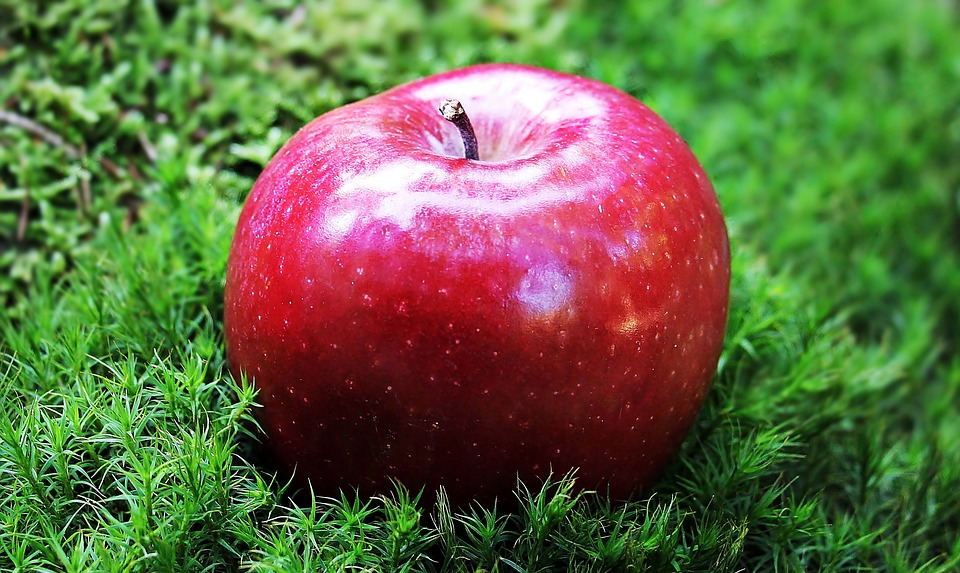

In [ ]:
#@title Supply a path to download a relevant image
IMAGE_PATH = "https://i.ibb.co/2tsXmCV/image.png" #@param {type:"string"}

!wget -q -O image.png $IMAGE_PATH
Image.open('image.png')

In [ ]:
#@title Load the TFLite model
interpreter = tf.lite.Interpreter(model_path="/content/fruits_detector_dr.tflite")
interpreter.allocate_tensors()
_, HEIGHT, WIDTH, _ = interpreter.get_input_details()[0]['shape']
print(f"Height and width accepted by the model: {HEIGHT, WIDTH}")

Height and width accepted by the model: (320, 320)


In [ ]:
#@title Image preprocessing utils
def preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.io.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    original_image = img
    resized_img = tf.image.resize(img, (HEIGHT, WIDTH))
    resized_img = resized_img[tf.newaxis, :]
    return resized_img, original_image

In [ ]:
#@title Define the label dictionary and color map
LABEL_DICT = {
    0: "orange",
    1: "banana",
    2: "apple"
}

COLORS = np.random.randint(0, 255, size=(len(LABEL_DICT), 3), 
                            dtype="uint8")

In [ ]:
#@title Inference utils
def display_results(image_path, threshold=0.3):
    # Load the input image and preprocess it
    preprocessed_image, original_image = preprocess_image(image_path)

    # =============Perform inference=====================
    start_time = time.monotonic()
    results = detect_objects(interpreter, preprocessed_image, threshold=threshold)
    print(f"Elapsed time: {(time.monotonic() - start_time)*1000} miliseconds")

    # =============Display the results====================
    original_numpy = original_image.numpy()
    for obj in results:
        # Convert the bounding box figures from relative coordinates
        # to absolute coordinates based on the original resolution
        ymin, xmin, ymax, xmax = obj['bounding_box']
        xmin = int(xmin * original_numpy.shape[1])
        xmax = int(xmax * original_numpy.shape[1])
        ymin = int(ymin * original_numpy.shape[0])
        ymax = int(ymax * original_numpy.shape[0])

        # Grab the class index for the current iteration
        idx = int(obj['class_id'])
        # Skip the background
        if idx >= len(LABEL_DICT):
            continue

        # Draw the bounding box and label on the image
        color = [int(c) for c in COLORS[idx]]
        cv2.rectangle(original_numpy, (xmin, ymin), (xmax, ymax), 
                    color, 2)
        y = ymin - 15 if ymin - 15 > 15 else ymin + 15
        label = "{}: {:.2f}%".format(LABEL_DICT[idx],
            obj['score'] * 100)
        cv2.putText(original_numpy, label, (xmin, y),
            cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # return the final imaage
    original_int = (original_numpy * 255).astype(np.uint8)
    return original_int

Elapsed time: 75.1978989997042 miliseconds


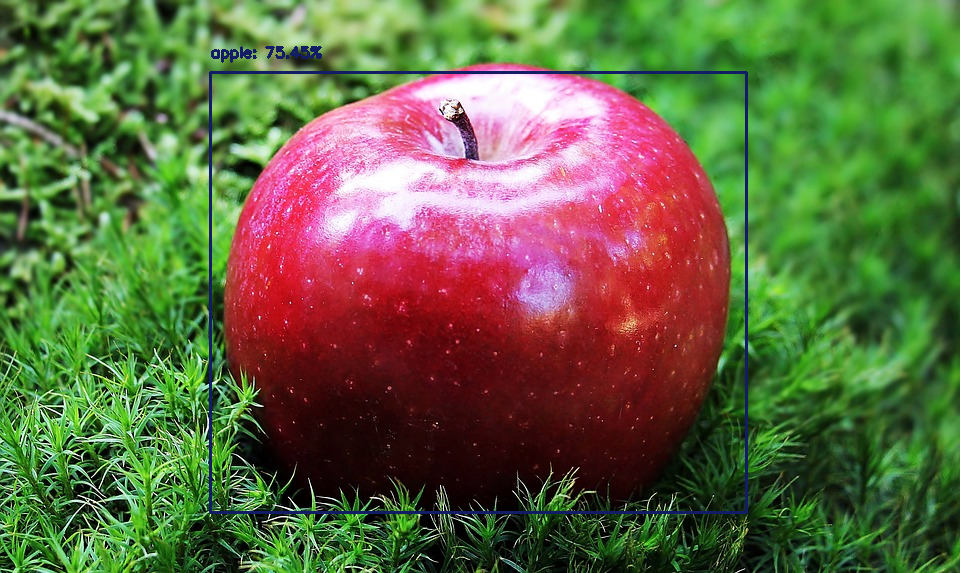

In [ ]:
#@title Run inference and measure the inference time
resultant_image = display_results("/content/image.png", threshold=0.3)
Image.fromarray(resultant_image)

**Note** that you might see some unexpected results because the annotations in the training dataset are faulty at place. Due to this the model training can suffer a lot. 